## Importing Libraries

In [1]:
!pip install opendatasets fasttext

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 3.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pybind11-2.13.0-py3-none-any.whl (238 kB)
  Created wheel for fasttext: filename=fasttext-0.9.3-cp310-cp310-linux_x86_64.whl size=4246840 sha256=796f38214ce99784816875419df5a35af6cbd67163b9000dfc2f8938853dd67d
  Stored in directory: /root/.cache/pip/wheels/0d/a2/00/81db54d3e6a8199b829d58e02cec2ddb20ce3e59fad8d3c92a
Successfully built fasttext


In [2]:
import opendatasets as od
od.download("https://www.kaggle.com/datasets/eeshawn/flickr30k?select=captions.txt")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: theatashaikh
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/eeshawn/flickr30k


100%|██████████| 4.08G/4.08G [00:56<00:00, 77.5MB/s]


In [3]:
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pickle
import re
import fasttext
from tqdm.notebook import tqdm
# from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, Concatenate, BatchNormalization, Bidirectional, GlobalAveragePooling2D, Dot, Activation, RepeatVector, TimeDistributed, Average
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from nltk.translate.bleu_score import corpus_bleu

In [4]:
import tensorflow as tf
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available: 1


## Drop the comment_number column from the captions.txt file to make it more like flikcr8k

Note: Also rename the images folder to Images from flickr30k-images

In [16]:
caption_df = pd.read_csv("/content/flickr30k/captions.txt")
caption_df = caption_df.drop(columns=['comment_number'])
caption_df.head()
caption_df.to_csv('/content/flickr30k/captions.txt', index=False, sep=',')

In [17]:
BASE_DIR = "/content/flickr30k"
WORKING_DIR = '/content/'

In [18]:
with open(os.path.join(BASE_DIR, 'captions.txt'), 'r') as file:
    lines = file.readlines()

In [19]:
captions_dict = {}
for line in lines:
    image_name, caption = line.strip().split(',', 1)
    if image_name not in captions_dict:
        captions_dict[image_name] = []
    captions_dict[image_name].append(caption)

## Visualizing images along with their captions

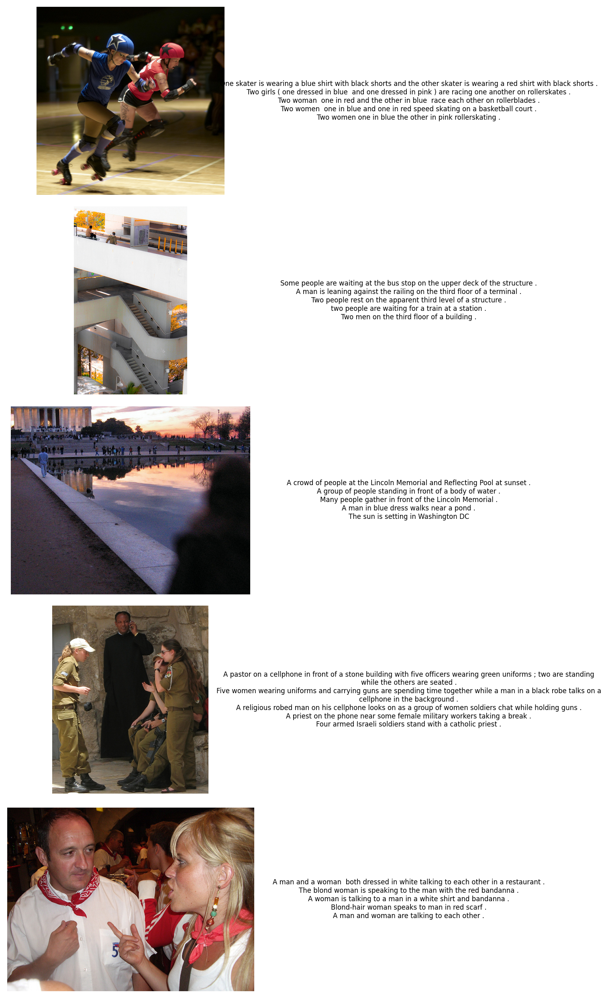

In [20]:
selected_images = random.sample(list(captions_dict.keys()), 5)
fig, axes = plt.subplots(5, 2, figsize=(15, 25))
for idx, image_name in enumerate(selected_images):
    image_path = os.path.join(BASE_DIR, 'Images', image_name)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    axes[idx, 0].imshow(image)
    axes[idx, 0].axis('off')
    rect = patches.Rectangle((0, 0), image.shape[1], image.shape[0], linewidth=10, edgecolor='#fff', facecolor='none')
    axes[idx, 0].add_patch(rect)
    captions = captions_dict[image_name]
    captions_text = "\n".join(captions)
    axes[idx, 1].text(0.5, 0.5, captions_text, ha='center', va='center', wrap=True, fontsize=12)
    axes[idx, 1].axis('off')
plt.tight_layout()
plt.show()

## Downloading pre-trained InceptionV3 model

In [21]:
# base_model = EfficientNetB0(weights='imagenet', include_top=False)
base_model = InceptionV3(weights='imagenet', include_top=False)
x = base_model.output
x = GlobalAveragePooling2D()(x)
model = Model(inputs=base_model.input, outputs=x)

87910968/87910968 [==============================] - 1s 0us/step


In [22]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, None, None, 32)       96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, None, None, 32)       0         ['batch_normalization[0][0

## Image Feature Extraction

In [23]:
features = {}
directory = os.path.join(BASE_DIR, 'Images')
for img_name in tqdm(os.listdir(directory)):
    img_path = os.path.join(directory, img_name)
    # image = load_img(img_path, target_size=(224, 224))  # EfficientNetB0 default input size
    image = load_img(img_path, target_size=(299, 299))  # InceptionV3 default input size
    image = img_to_array(image)
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    feature = model.predict(image, verbose=0)
    image_id = img_name.split('.')[0]
    features[image_id] = feature


  0%|          | 0/31783 [00:00<?, ?it/s]

In [24]:
pickle.dump(features, open(os.path.join(WORKING_DIR, 'features.pkl'), 'wb'))

In [25]:
with open(os.path.join(WORKING_DIR, 'features.pkl'), 'rb') as f:
    features = pickle.load(f)

In [26]:
with open(os.path.join(BASE_DIR, 'captions.txt'), 'r') as f:
    next(f)
    captions_doc = f.read()

In [27]:
mapping = {}
for line in tqdm(captions_doc.split('\n')):
    tokens = line.split(',')
    if len(line) < 2:
        continue
    image_id, caption = tokens[0], tokens[1:]
    image_id = image_id.split('.')[0]
    caption = " ".join(caption)
    if image_id not in mapping:
        mapping[image_id] = []
    mapping[image_id].append(caption)

  0%|          | 0/158916 [00:00<?, ?it/s]

## Cleaning Text

In [28]:
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            caption = captions[i]
            caption = caption.lower()
            caption = re.sub('[^A-Za-z ]+', '', caption)
            caption = re.sub('\s+', ' ', caption)
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word) > 1]) + ' endseq'
            captions[i] = caption

In [29]:
clean(mapping)

## Fasttext Vector Embeddings

In [30]:
#training fasttext for vector embeddings
with open('captions.txt', 'w') as f:
    for key in mapping:
        for caption in mapping[key]:
            f.write(caption + '\n')


fasttext_model = fasttext.train_unsupervised('captions.txt', model='skipgram', dim=512, epoch=10, lr=0.05, ws=5)


In [31]:
embedding_dim = 512
vocab_size = len(fasttext_model.words) + 1

embedding_matrix = np.zeros((vocab_size, embedding_dim))
word_index = {word: idx for idx, word in enumerate(fasttext_model.words, 1)}

for word, idx in word_index.items():
    embedding_matrix[idx] = fasttext_model[word]

# Determine max caption length
all_captions = [caption.split() for key in mapping for caption in mapping[key]]
max_length = max(len(caption) for caption in all_captions)

In [32]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
train = image_ids[:split]
test = image_ids[split:]

## Data Generation

In [33]:
#Data Generation Function
def data_generator(data_keys, mapping, features, word_index, max_length, vocab_size, batch_size):
    X1, X2, y = list(), list(), list()
    n = 0
    while 1:
        for key in data_keys:
            n += 1
            captions = mapping[key]
            for caption in captions:
                seq = [word_index[word] for word in caption.split() if word in word_index]
                for i in range(1, len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=max_length, padding='post')[0]
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == batch_size:
                yield (np.array(X1), np.array(X2)), np.array(y)
                X1, X2, y = list(), list(), list()
                n = 0

## Model Architecture

In [34]:
#Model Architecture
# inputs1 = Input(shape=(1280,))  # Change to match EfficientNetB0 output
inputs1 = Input(shape=(2048,))  # Change to match InceptionV3 output
fe1 = BatchNormalization()(inputs1)
fe2 = Dense(512, activation='relu')(fe1)
fe2_projected = RepeatVector(max_length)(fe2)

inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True, weights=[embedding_matrix], trainable=False)(inputs2)
se2 = BatchNormalization()(se1)
se3 = Bidirectional(LSTM(256, return_sequences=True))(se2)

attention = Dot(axes=[2, 2])([fe2_projected, se3])
attention = Activation('softmax')(attention)
context_vector = Dot(axes=[1, 1])([attention, se3])
context_vector = BatchNormalization()(context_vector)


context_vector = tf.keras.layers.Flatten()(context_vector)
decoder1 = Concatenate()([context_vector, fe2])
decoder2 = Dense(512, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
optimizer = Adam(learning_rate=5e-4, clipvalue=5.0)
model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=['accuracy'])


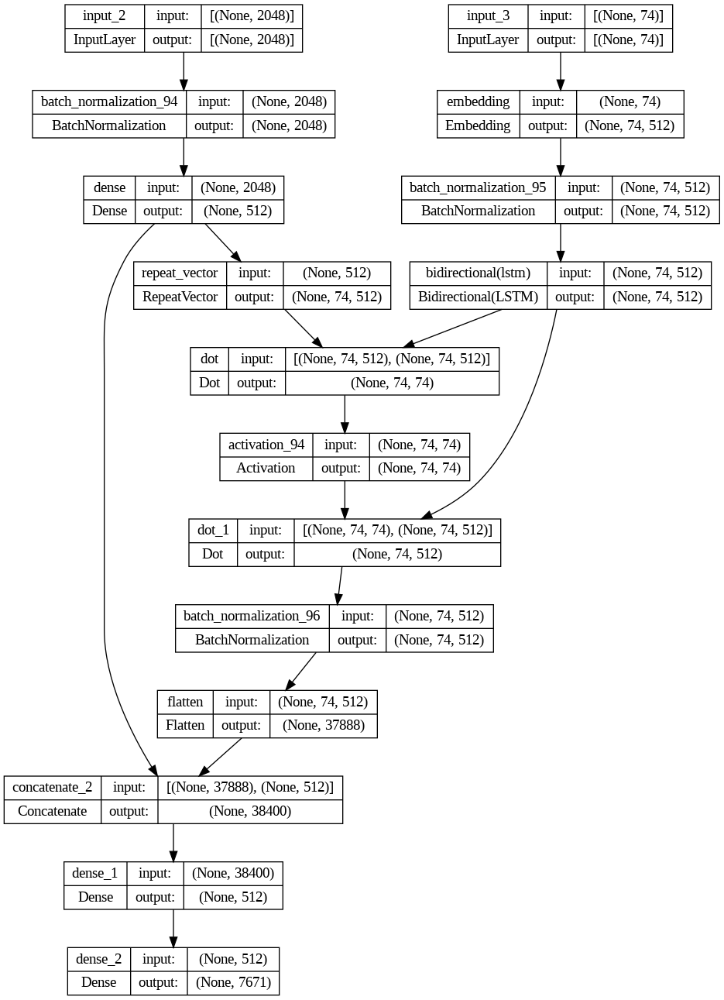

In [35]:
from tensorflow.keras.utils import to_categorical, plot_model
plot_model(model, show_shapes=True)

## Training the Model

In [36]:
epochs = 20
batch_size = 32
steps_per_epoch = len(train) // batch_size
validation_steps = len(test) // batch_size

In [37]:
checkpoint_filepath = os.path.join(WORKING_DIR, 'model_checkpoint.keras')
model_checkpoint_callback = ModelCheckpoint(filepath=checkpoint_filepath, save_weights_only=False, monitor='val_loss', mode='min', save_best_only=True)

In [38]:
train_generator = data_generator(train, mapping, features, word_index, max_length, vocab_size, batch_size)
valid_generator = data_generator(test, mapping, features, word_index, max_length, vocab_size, batch_size)

# Train the model
history = model.fit(train_generator,
                    epochs=epochs,
                    steps_per_epoch=steps_per_epoch,
                    validation_data=valid_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_checkpoint_callback])

Epoch 1/20
893/893 [==============================] - 338s 362ms/step - loss: 4.0552 - accuracy: 0.2745 - val_loss: 3.7504 - val_accuracy: 0.2930
Epoch 2/20
893/893 [==============================] - 325s 363ms/step - loss: 3.2810 - accuracy: 0.3295 - val_loss: 3.6299 - val_accuracy: 0.3056
Epoch 3/20
893/893 [==============================] - 324s 362ms/step - loss: 2.9976 - accuracy: 0.3519 - val_loss: 3.6822 - val_accuracy: 0.3061
Epoch 4/20
893/893 [==============================] - 326s 365ms/step - loss: 2.7881 - accuracy: 0.3742 - val_loss: 3.7869 - val_accuracy: 0.3042
Epoch 5/20
893/893 [==============================] - 322s 361ms/step - loss: 2.6231 - accuracy: 0.3964 - val_loss: 3.9105 - val_accuracy: 0.2995
Epoch 6/20
893/893 [==============================] - 322s 361ms/step - loss: 2.4894 - accuracy: 0.4164 - val_loss: 4.0297 - val_accuracy: 0.2944
Epoch 7/20
893/893 [==============================] - 321s 360ms/step - loss: 2.3831 - accuracy: 0.4332 - val_loss: 4.1733 -

In [39]:
pickle.dump(word_index, open(os.path.join(WORKING_DIR, 'word_index.pkl'), 'wb'))

In [40]:
def idx_to_word(integer, word_index):
    for word, index in word_index.items():
        if index == integer:
            return word
    return None

In [41]:
def predict_caption(model, image, word_index, max_length):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [word_index[word] for word in in_text.split() if word in word_index]
        sequence = pad_sequences([sequence], maxlen=max_length, padding='post')
        yhat = model.predict([image, sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = idx_to_word(yhat, word_index)
        if word is None:
            break
        in_text += " " + word
        if word == 'endseq':
            break
    return in_text

## Evaluation on Test-set

In [ ]:
actual, predicted = list(), list()
for key in tqdm(test):
    captions = mapping[key]
    y_pred = predict_caption(model, features[key], word_index, max_length)
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    actual.append(actual_captions)
    predicted.append(y_pred)

print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))


  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1: 0.538838
BLEU-2: 0.305489


In [42]:
model.save(os.path.join(WORKING_DIR, 'model.h5'))

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [43]:
model.save_weights(os.path.join(WORKING_DIR, 'model-weights.h5'))

## Results

In [44]:
def generate_caption(image_name):
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "Images", image_name)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    y_pred = predict_caption(model, features[image_id], word_index, max_length)

    print("Generated caption:", y_pred)
    plt.imshow(image)

Generated caption: startseq group of people are sitting at bar endseq


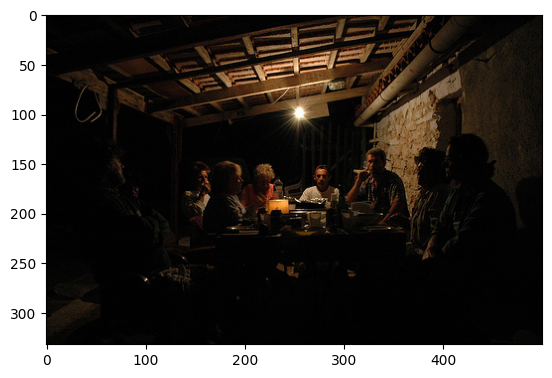

In [76]:
generate_caption('107582366.jpg')

Generated caption: startseq an elderly woman pan frying vegetables in kitchen endseq


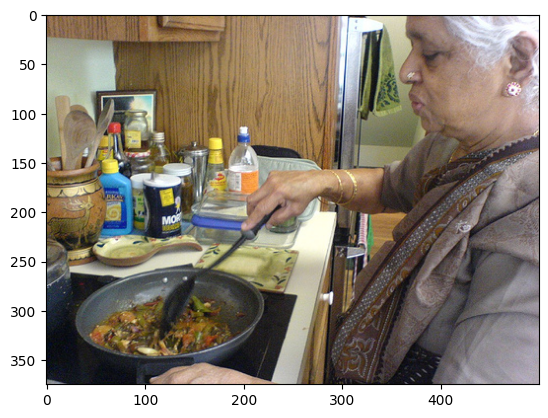

In [74]:
generate_caption('1088385559.jpg')

Generated caption: startseq man in blue jeans and red shirt is walking down window of building endseq


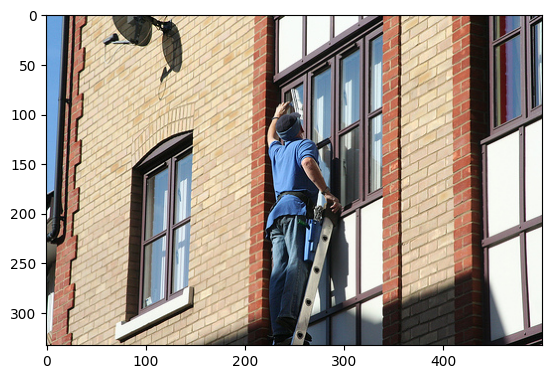

In [48]:
generate_caption('1000344755.jpg')

Generated caption: startseq people are playing volleyball on sandy beach endseq


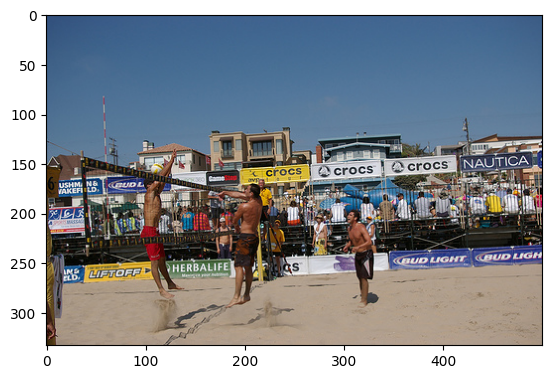

In [73]:
generate_caption('1080230428.jpg')

Generated caption: startseq darkhaired man in gray shirt is sitting at table in restaurant endseq


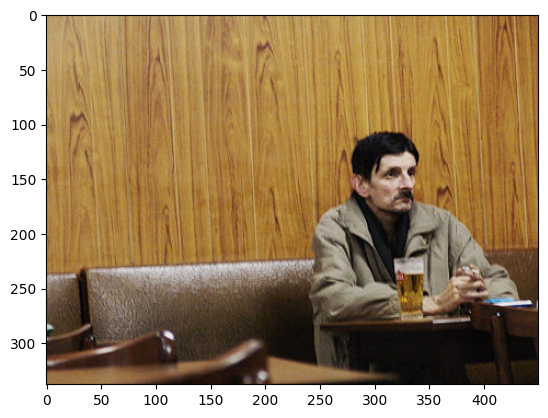

In [50]:
generate_caption('10090841.jpg')

Generated caption: startseq two men are riding their bicycles down dirt path in the woods endseq


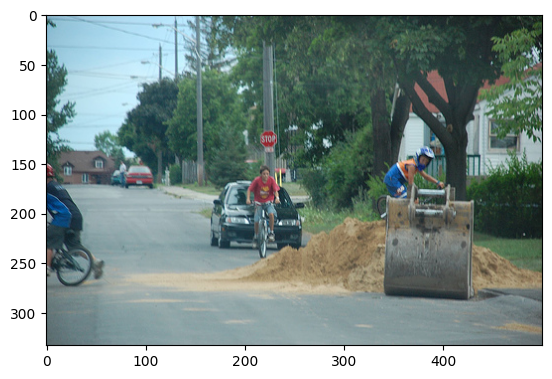

In [71]:
generate_caption('1065323785.jpg')

Generated caption: startseq group of people practice martial arts demonstration endseq


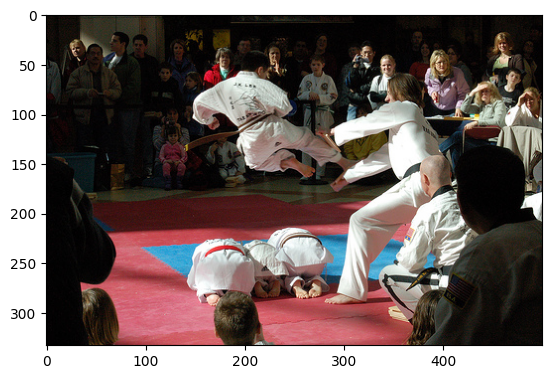

In [52]:
generate_caption('101362650.jpg')

Generated caption: startseq man in suit is walking through the street carrying plastic bag endseq


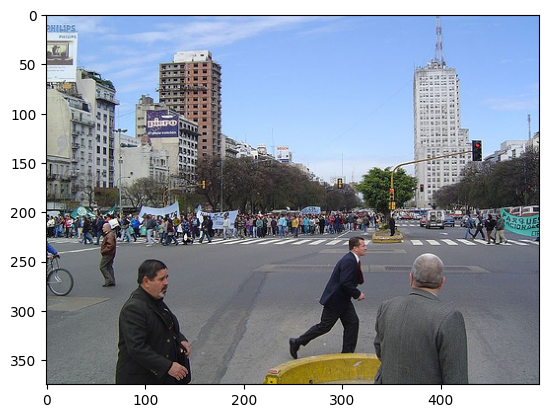

In [53]:
generate_caption('101559400.jpg')

Generated caption: startseq gymnast is performing gymnastics routine endseq


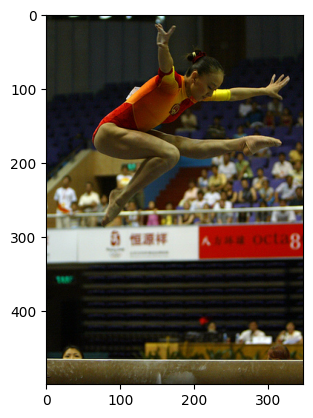

In [54]:
generate_caption('1017675163.jpg')

Generated caption: startseq an old man in gray shirt is working on project endseq


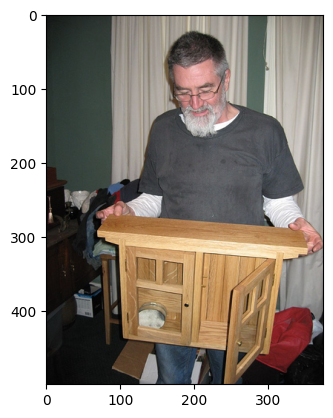

In [55]:
generate_caption('1021332107.jpg')

Generated caption: startseq two women in kitchen making food endseq


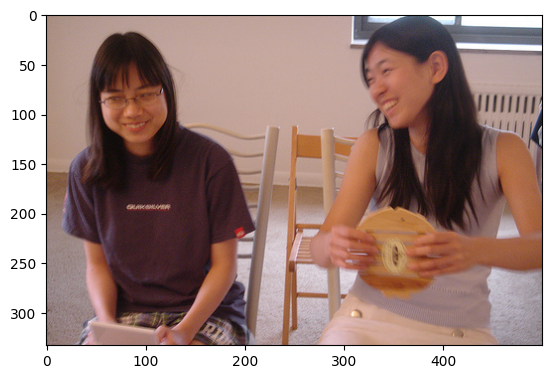

In [68]:
generate_caption('1056415186.jpg')

Generated caption: startseq people bundled up in cold weather up in cold weather gear endseq


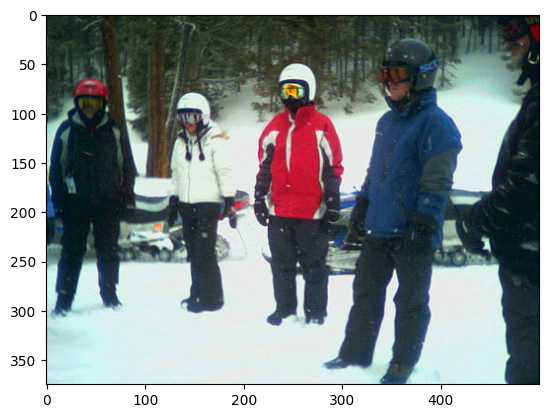

In [58]:
generate_caption('102617084.jpg')

Generated caption: startseq woman in blue dress is sitting on the edge of cement bench and says endseq


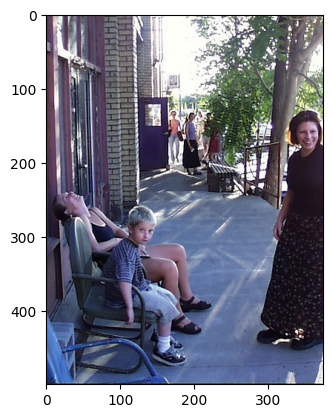

In [59]:
generate_caption('102851549.jpg')

Generated caption: startseq child in blue shirt is climbing chain link fence endseq


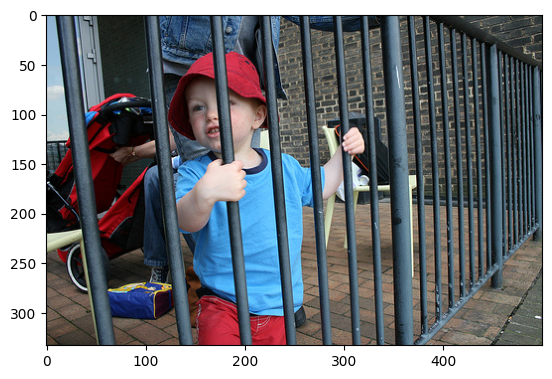

In [61]:
generate_caption('1031973097.jpg')

Generated caption: startseq young asian boy wearing red rain boots and red plaid kilt dives his arm in the air endseq


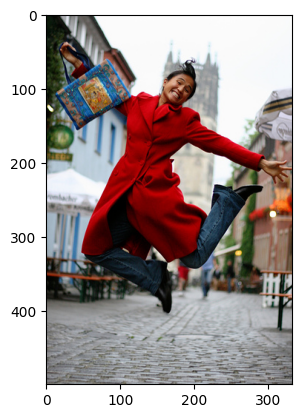

In [67]:
generate_caption('1054620089.jpg')

Generated caption: startseq young boy runs through field endseq
Generated caption: startseq in traditional scottish band walking in parade endseq
Generated caption: startseq dog runs down trail with stick in the dog mouth endseq
Generated caption: startseq group of soldiers are in uniform in theater endseq
Generated caption: startseq man is standing in the snow watching the water endseq


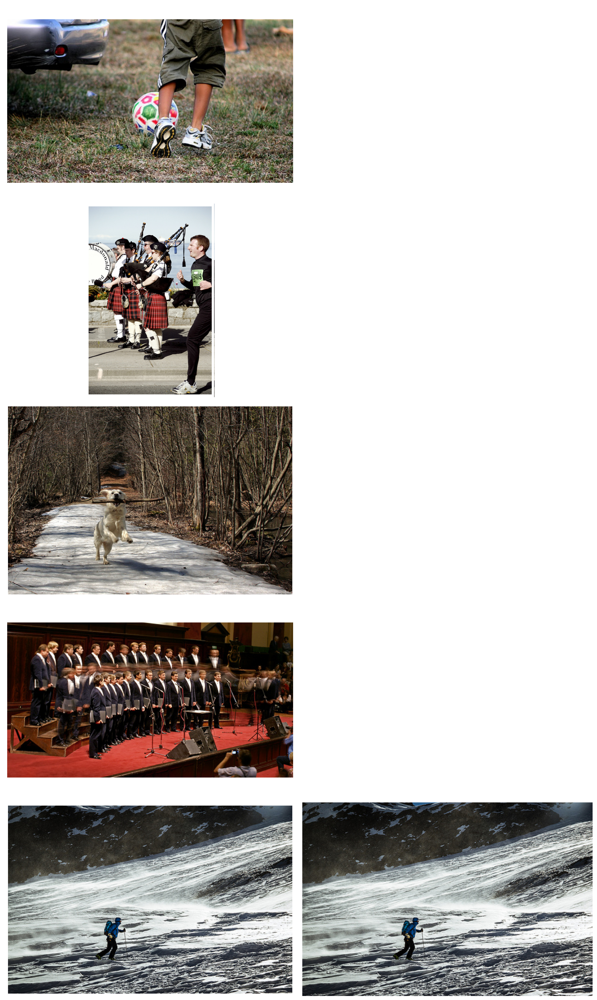

In [78]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

def display_random_images_with_captions(directory, num_images=5):
    image_list = [f for f in os.listdir(directory) if f.endswith('.jpg')]

    random_images = random.sample(image_list, num_images)

    fig, axes = plt.subplots(num_images, 2, figsize=(15, 5 * num_images))

    for idx, image_name in enumerate(random_images):

        image_path = os.path.join(directory, image_name)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        axes[idx, 0].imshow(image)
        axes[idx, 0].axis('off')


        rect = patches.Rectangle((0, 0), image.shape[1], image.shape[0], linewidth=10, edgecolor='#fff', facecolor='none')
        axes[idx, 0].add_patch(rect)


        caption = generate_caption(image_name)
        axes[idx, 1].text(0.5, 0.5, caption, ha='center', va='center', wrap=True, fontsize=12)
        axes[idx, 1].axis('off')



    plt.tight_layout()
    plt.show()



image_directory = '/content/flickr30k/Images'
display_random_images_with_captions(image_directory)


In [79]:
caption_model = tf.keras.models.load_model('model.h5')

In [80]:
caption_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 input_3 (InputLayer)        [(None, 74)]                 0         []                            
                                                                                                  
 batch_normalization_94 (Ba  (None, 2048)                 8192      ['input_2[0][0]']             
 tchNormalization)                                                                                
                                                                                                  
 embedding (Embedding)       (None, 74, 512)              3927552   ['input_3[0][0]']       

In [81]:
def load_image_from_url(url, target_size=(299, 299)):
    response = requests.get(url)
    image_array = np.asarray(bytearray(response.content), dtype=np.uint8)
    img = cv2.imdecode(image_array, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img = cv2.resize(img, target_size)
    return img

In [82]:
def display_image_with_caption(image, caption):
    fig, ax = plt.subplots(1)
    ax.imshow(image)
    ax.axis('off')


    rect = patches.Rectangle((0, 0), image.shape[1], image.shape[0], linewidth=5, edgecolor='r', facecolor='none')
    ax.add_patch(rect)


    plt.figtext(0.5, 0.01, caption, wrap=True, horizontalalignment='center', fontsize=12)
    plt.show()

## Testing on Random Images from Internet

In [83]:
def generate_caption_for_image_url(image_url, caption_model, word_index, max_length):
    # Load and preprocess the image
    image = load_image_from_url(image_url)
    image_array = img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)
    image_array = preprocess_input(image_array)

    # Extract features using EfficientNetB0
    # base_model = EfficientNetB0(weights='imagenet', include_top=False) # for EfficientNetB0
    base_model = InceptionV3(weights='imagenet', include_top=False) # for InceptionV3
    x = GlobalAveragePooling2D()(base_model.output)
    feature_ext_model = Model(inputs=base_model.inputs, outputs=x)
    features = feature_ext_model.predict(image_array, verbose=0)

    # Generate caption using the caption model
    caption = predict_caption(caption_model, features, word_index, max_length)
    caption = caption.replace('startseq', '').replace('endseq', '').strip()

    display_image_with_caption(image, caption)

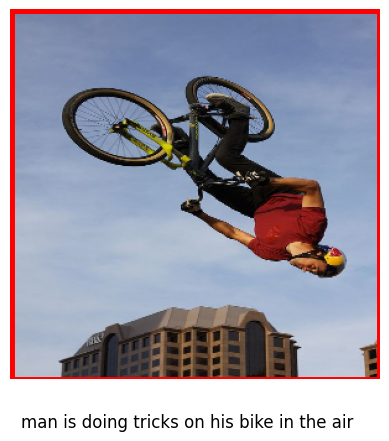

In [84]:
import requests
image_url = 'https://i.pinimg.com/736x/7e/71/d3/7e71d3778c649016dff30852487b3397.jpg'
generate_caption_for_image_url(image_url, caption_model, word_index, max_length)

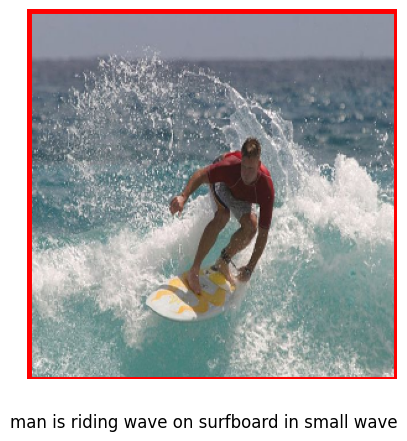

In [85]:
image_url = 'https://www.tensorflow.org/images/surf.jpg'
generate_caption_for_image_url(image_url, caption_model, word_index, max_length)

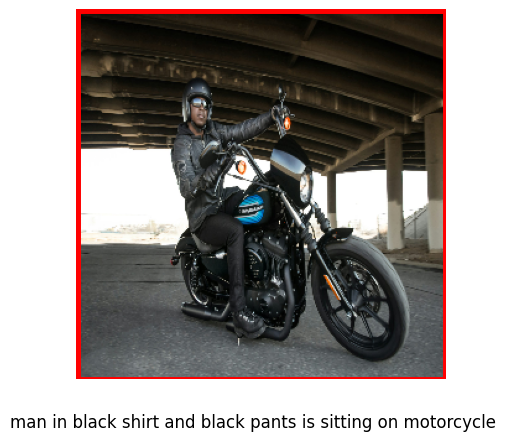

In [86]:
image_url = 'https://images.unsplash.com/photo-1558980394-da1f85d3b540?fm=jpg&w=3000&auto=format&fit=crop&q=60&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D'
generate_caption_for_image_url(image_url, caption_model, word_index, max_length)